## S-MODE IOP2 summary plots

I ran SMODE_VIIRS_climatology.ipynb on an EC2 instance and saved the VIIRS data with clear scenes to Zarr format.  Now, I want to generate plots through time with S-MODE asset postions.



In [1]:
cd ~/Python/S-MODE_analysis/code_IOP2

/home/jtomf/Python/S-MODE_analysis/code_IOP2


In [2]:
import xarray as xr
import functions
import numpy as np

import matplotlib.pyplot as plt
import matplotlib
from matplotlib.ticker import FormatStrFormatter
from matplotlib import ticker, rc, cm

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
from cartopy.io.shapereader import Reader

%matplotlib widget

In [3]:
plt.rcParams['figure.figsize'] = (7.5,6)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 400

savefig = True # set to true to save plots as file
!mkdir ../plots/IOP2_summary2

__figdir__ = '../plots/IOP2_summary2/'
savefig_args = {'bbox_inches':'tight', 'pad_inches':0.2}
plotfiletype='png'

In [4]:
datapath = '../data/processed/IOP2_VIIRS/'

In [5]:
WG_list = ['WHOI22','WHOI32','WHOI43','STOKES', 'PLANCK', 'KELVIN', 'CARSON','PASCAL','WHOI1102']
path='../data/raw/WG_NRT_IOP2/'

# Make a list of the files:
n=0
file_list = []
for WG in WG_list:
    file = path+'adcp_'+WG+'.nc'
    file_list.append(file)

# Read in cleaned ADCP files from all WG
n=0
for WG in WG_list:
    file = file_list[n]
    varstr = 'adcp_'+WG
    locals()[varstr]=xr.open_dataset(file,decode_times=True) #Time and z already fixed in WG_realtime_cleanup.ipynb
    n=n+1
    print(file)



../data/raw/WG_NRT_IOP2/adcp_WHOI22.nc
../data/raw/WG_NRT_IOP2/adcp_WHOI32.nc
../data/raw/WG_NRT_IOP2/adcp_WHOI43.nc
../data/raw/WG_NRT_IOP2/adcp_STOKES.nc
../data/raw/WG_NRT_IOP2/adcp_PLANCK.nc
../data/raw/WG_NRT_IOP2/adcp_KELVIN.nc
../data/raw/WG_NRT_IOP2/adcp_CARSON.nc
../data/raw/WG_NRT_IOP2/adcp_PASCAL.nc
../data/raw/WG_NRT_IOP2/adcp_WHOI1102.nc


In [6]:
# Do Sally Ride
SR_adcp_file = '../data/raw/SR_NRT_IOP2/wh300_SR_ADCP_clean.nc'
adcp_SR = xr.open_dataset(SR_adcp_file)

In [7]:
# Center location
#site = 'S-MODE'
#site = 'S-MODE IOP1'
site = 'S-MODE IOP2 zoom'
#site = 'SPURS-1'

if site == 'S-MODE':
    lon0 = -123.5
    lat0 = 37.5 
    dlon = 2.5 # half of box width in lon
    dlat = 1.5 # half of box width in lat
elif site == 'S-MODE IOP1':
    lon0 = -124.5
    lat0 = 37
    dlon = 2.5 # half of box width in lon
    dlat = 1.5 # half of box width in lat
elif site == 'S-MODE IOP2':
    lon0 = -124.5
    lat0 = 36.5
    dlon = 2.5 # half of box width in lon
    dlat = 2.0 # half of box width in lat
elif site == 'S-MODE IOP2 zoom':
    lon0 = -124.9
    lat0 = 37.1
    dlon = 1.5 # half of box width in lon
    dlat = 1.0 # half of box width in lat

# Define the max/min lon
lon_min = lon0 - dlon
lon_max = lon0 + dlon
lat_min = lat0 - dlat
lat_max = lat0 + dlat

In [8]:
ds1_name = 'VIIRS_NPP'
ds2_name = 'VIIRS_N20'
ds1 = xr.open_zarr(datapath+ds1_name)
ds2 = xr.open_zarr(datapath+ds2_name)

In [9]:
ds2

<xarray.Dataset>
Dimensions:                  (time: 19, lat: 200, lon: 250)
Coordinates:
  * lat                      (lat) float32 38.49 38.47 38.45 ... 34.53 34.51
  * lon                      (lon) float32 -127.0 -127.0 ... -122.0 -122.0
  * time                     (time) datetime64[ns] 2023-04-01T09:20:01 ... 20...
Data variables:
    crs                      (time) int32 dask.array<chunksize=(19,), meta=np.ndarray>
    l2p_flags                (time, lat, lon) int16 dask.array<chunksize=(1, 200, 250), meta=np.ndarray>
    or_number_of_pixels      (time, lat, lon) float32 dask.array<chunksize=(1, 200, 250), meta=np.ndarray>
    quality_level            (time, lat, lon) float32 dask.array<chunksize=(1, 200, 250), meta=np.ndarray>
    sea_surface_temperature  (time, lat, lon) float32 dask.array<chunksize=(1, 200, 250), meta=np.ndarray>
    sses_standard_deviation  (time, lat, lon) float32 dask.array<chunksize=(1, 200, 250), meta=np.ndarray>
    sst_dtime                (time, lat, lon) timedelta64[ns] dask.array<chunksize=(1, 200, 250), meta=np.ndarray>
    sst_front_position       (time, lat, lon) float32 dask.array<chunksize=(1, 200, 250), meta=np.ndarray>
    sst_gradient_magnitude   (time, lat, lon) float32 dask.array<chunksize=(1, 200, 250), meta=np.ndarray>
Attributes: (12/58)
    Conventions:                Conventions = CF-1.7, ACDD-1.3
    acknowledgement:            Please acknowledge the use of these data with...
    aggregator_version:         V1.00
    cdm_data_type:              grid
    col_count:                  2348
    col_start:                  2367
    ...                         ...
    summary:                    Sea surface temperature retrievals produced b...
    time_coverage_end:          20230401T093000Z
    time_coverage_start:        20230401T092000Z
    title:                      VIIRS L3U SST
    uuid:                       81f689ae-01c2-4d16-8c33-c0ad48e4c55e
    westernmost_longitude:      -132.4499969482422

In [10]:
ds = adcp_SR

In [11]:
ds

<xarray.Dataset>
Dimensions:        (time: 15035, depth_cell: 50)
Coordinates:
  * time           (time) datetime64[ns] 2023-04-09T03:52:15 ... 2023-05-01T1...
Dimensions without coordinates: depth_cell
Data variables: (12/14)
    trajectory     (time) int32 ...
    Longitude      (time) float64 ...
    Latitude       (time) float64 ...
    depth          (time, depth_cell) float32 ...
    current_east   (time, depth_cell) float32 ...
    current_north  (time, depth_cell) float32 ...
    ...             ...
    pflag          (time, depth_cell) uint8 ...
    heading        (time) float32 ...
    tr_temp        (time) float32 ...
    num_pings      (time) int16 ...
    uship          (time) float32 ...
    vship          (time) float32 ...
Attributes:
    featureType:   trajectoryProfile
    history:       Created: 2023-04-09 23:50:44 UTC
    Conventions:   COARDS CF-1.6
    software:      pycurrents
    hg_changeset:  3306:670a5d9ffffd
    title:         Shipboard ADCP velocity profiles
    description:   Shipboard ADCP velocity profiles from SR2307 using instrum...
    cruise_id:     SR2307
    sonar:         wh300
    yearbase:      2023
    ship_name:     Sally Ride

In [12]:
# Function to plot WG position and vel at time of SST image
def plot_SR_positions(ax,t0,skip, **kwargs):
    # List of WGs
    # Read in cleaned ADCP files from all WG
    tmin = t0 - np.timedelta64(12,'h')#np.datetime64('now')
    tmax = t0 + np.timedelta64(12,'h')#np.datetime64('now')
    n=0
    ds = adcp_SR
    tind = np.flatnonzero(np.logical_and(ds.time>tmin,ds.time<tmax))
    tind=tind[0:-1:skip]
    if tind.size==0:
        print('Skipping SR')
    else:
        #ax.scatter(ds.Longitude[tind[-1]].values,ds.Latitude[tind[-1]].values,s=5,color='k',transform=ccrs.PlateCarree())
        ax.plot(ds.Longitude[tind].values,ds.Latitude[tind].values,color='m',transform=ccrs.PlateCarree())
            


In [13]:
# Function to plot WG position and vel at time of SST image
def plot_WG_positions(ax,t0,skip, **kwargs):
    # List of WGs
    # Read in cleaned ADCP files from all WG
    tmin = t0 - np.timedelta64(12,'h')#np.datetime64('now')
    tmax = t0 + np.timedelta64(12,'h')#np.datetime64('now')
    n=0
    for WG in WG_list:
        ds = eval('adcp_'+WG)
        tind = np.flatnonzero(np.logical_and(ds.time>tmin,ds.time<tmax))
        tind=tind[0:-1:skip]
        if tind.size==0:
            print('Skipping '+WG)
            continue
        else:
            #ax.scatter(ds.Longitude[tind[-1]].values,ds.Latitude[tind[-1]].values,s=5,color='k',transform=ccrs.PlateCarree())
            ax.plot(ds.Longitude[tind].values,ds.Latitude[tind].values,color='k',transform=ccrs.PlateCarree())
            


In [14]:
swot_file = "../../S-MODE_analysis/data/SWOT_orbit/sph_calval_swath/swot_calval_orbit_june2015-v2_swath.shp"
nadir_file = "../../S-MODE_analysis/data/SWOT_orbit/shp_calval_nadir/swot_calval_orbit_june2015-v2_nadir.shp"
def plot_SWOT(ax):
    ax.add_geometries(Reader(swot_file).geometries(), ccrs.PlateCarree(), facecolor='white',alpha=0.15,edgecolor='k')
    ax.add_geometries(Reader(nadir_file).geometries(), ccrs.PlateCarree(), facecolor='none',linestyle='--',alpha=.5,edgecolor='k')
    return

In [15]:
def plot_SST_map(ds2, mean_SST):
    
    fig = plt.figure()
    ax = plt.axes(projection = ccrs.PlateCarree(central_longitude=-125))  # Orthographic
    extent = [lon_min, lon_max,lat_min, lat_max]
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    # This string of the time of the SST selected will be useful
    day_str = np.datetime_as_string(ds2.time,unit='m')


    plt.set_cmap(cmap=plt.get_cmap('turbo')) #try turbo, nipy_spectral and gist_ncar
    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    ax.set_title('SST, ' + day_str, size = 10.)

    # Does not do what I think it should:
    ax.minorticks_on()
    ax.tick_params(axis='both',which='both',direction='inout',top=True, right=True,zorder=100)

    V = mean_SST+[-0.5,.5] #range for colorbar

    ax.coastlines()
    ax.add_feature(cartopy.feature.LAND, zorder=3, facecolor=[.6,.6,.6], edgecolor='black')
    cs = ax.pcolormesh(ds2.lon,ds2.lat,ds2.sea_surface_temperature.squeeze()-274.15,vmin=V[0],vmax=V[1],transform=ccrs.PlateCarree())
    # cs = ax.pcolormesh(ds2.lon,ds2.lat,ds2.sea_surface_temperature.squeeze().notnull(),transform=ccrs.PlateCarree())
    cb = plt.colorbar(cs,fraction = 0.022,extend='both')
    cb.set_label('SST [$\circ$C]',fontsize = 10)
    functions.plot_ops_area_IOP2(ax,transform=ccrs.PlateCarree(),color='k')
    plot_SWOT(ax)
    




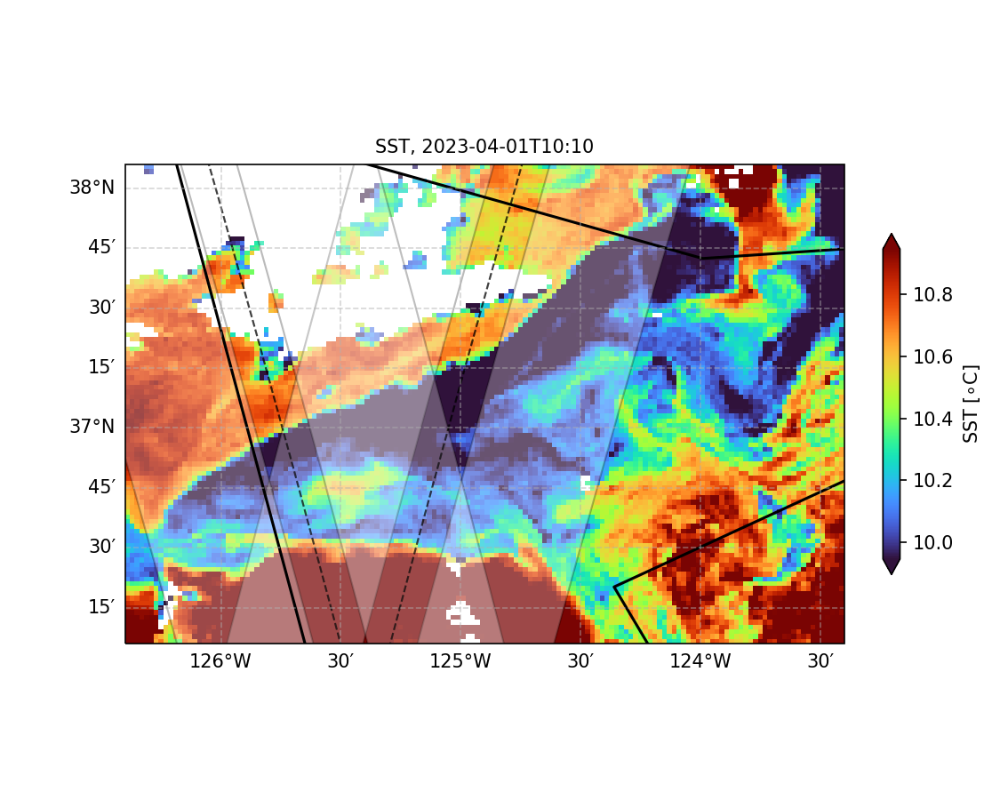

Skipping PASCAL
Skipping WHOI1102
Skipping SR


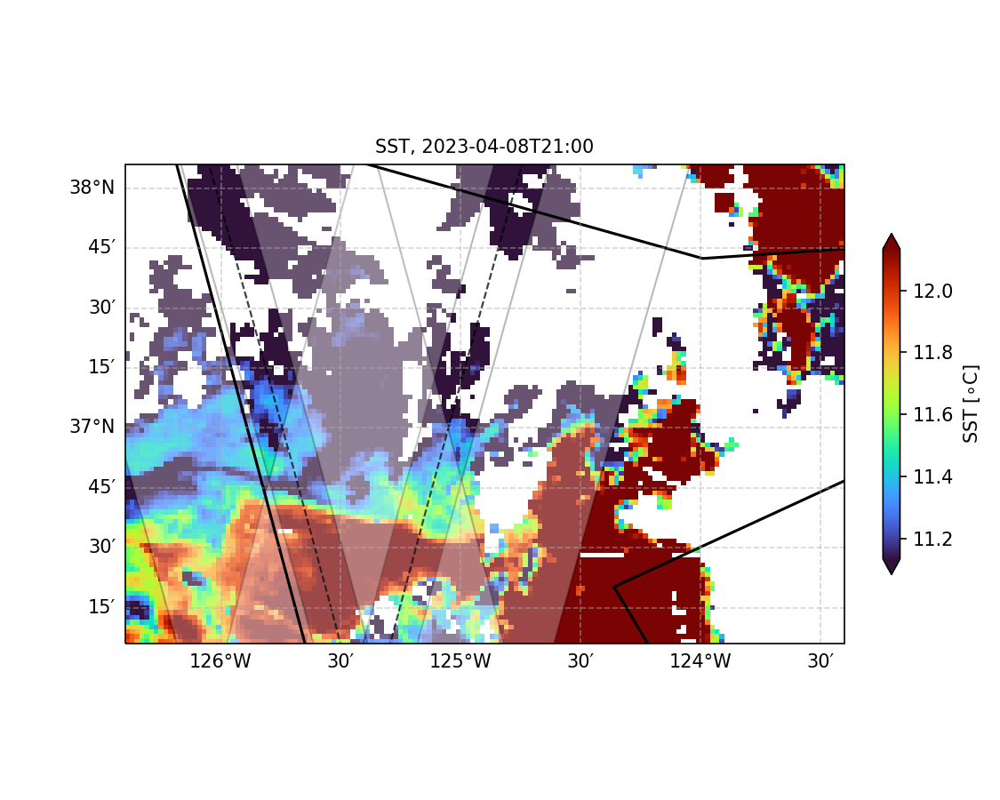

Skipping PASCAL
Skipping WHOI1102


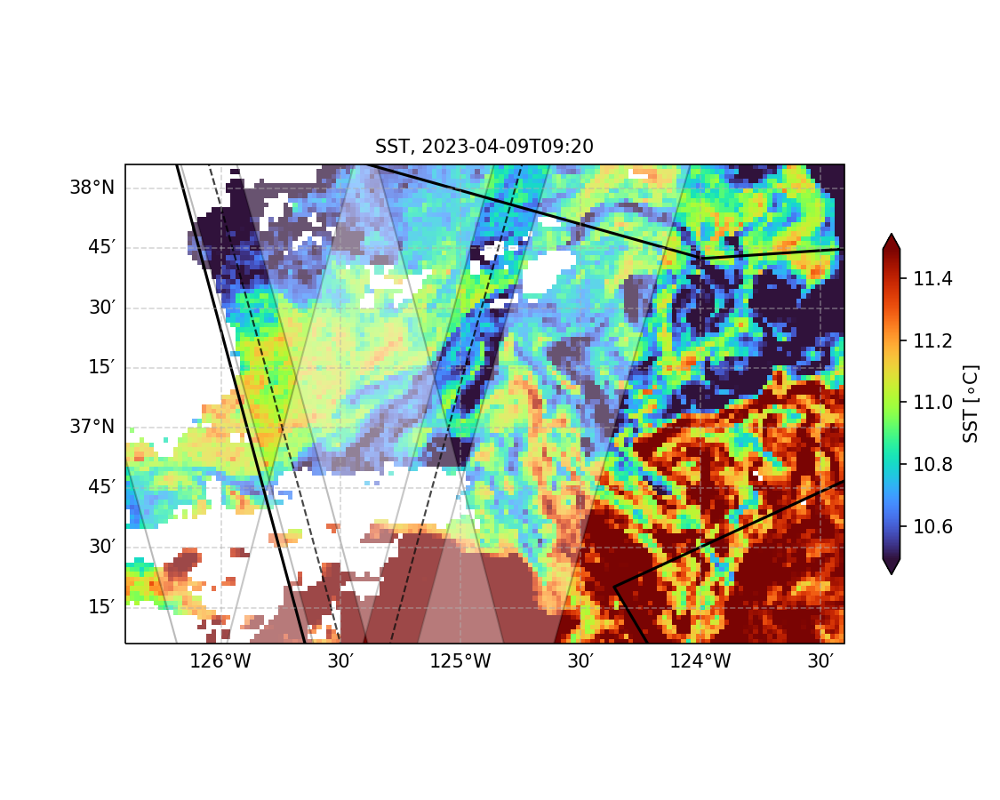

Skipping PASCAL
Skipping WHOI1102


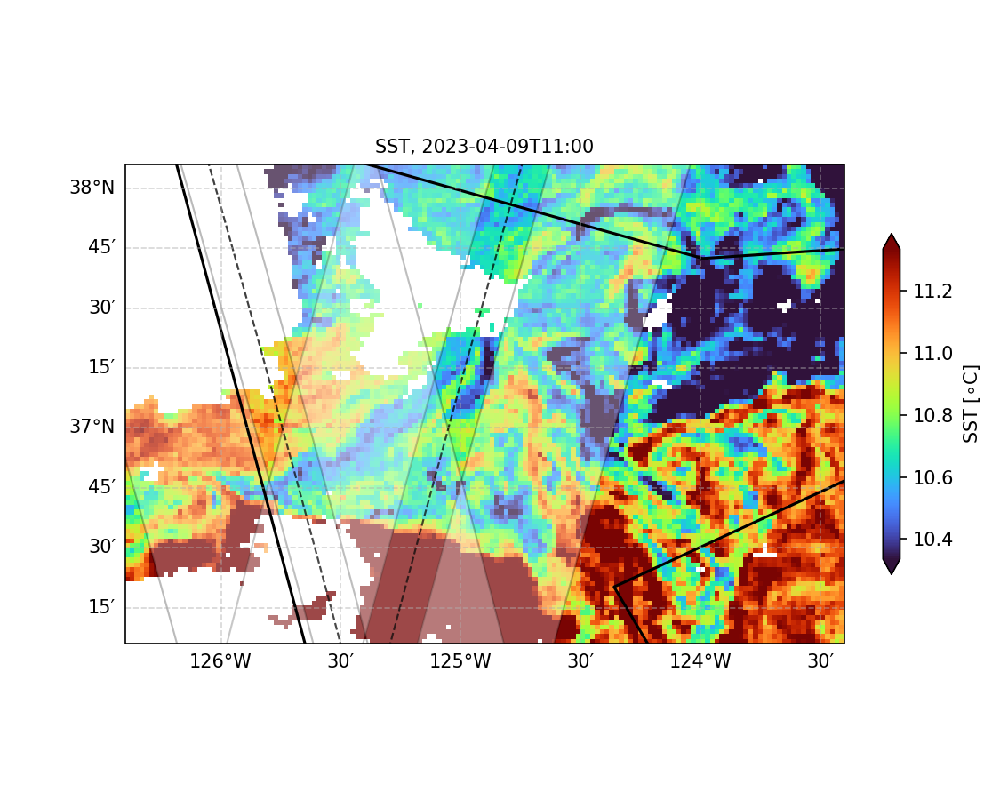

Skipping PASCAL
Skipping WHOI1102


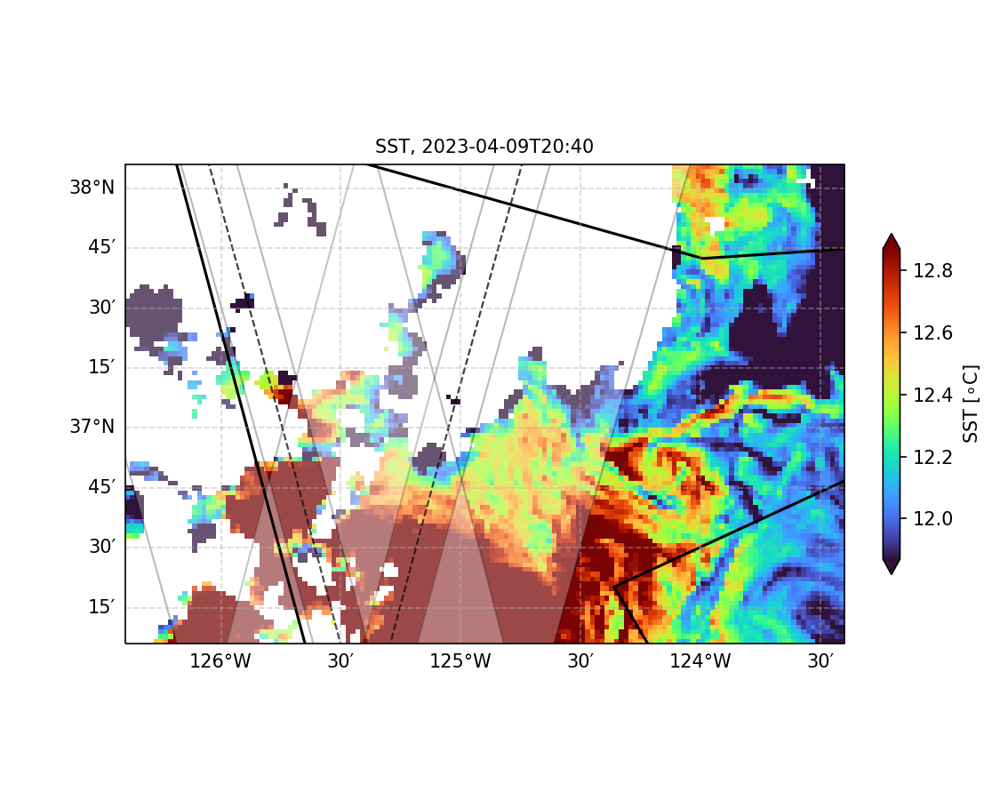

Skipping PASCAL
Skipping WHOI1102


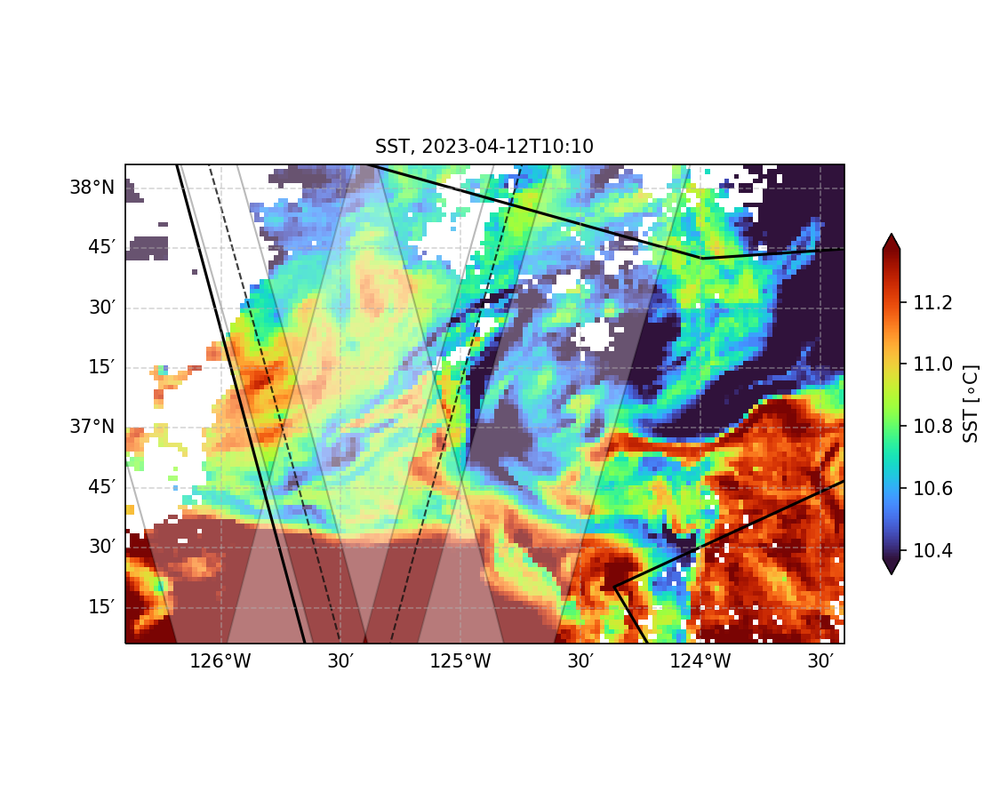

Skipping PASCAL
Skipping WHOI1102


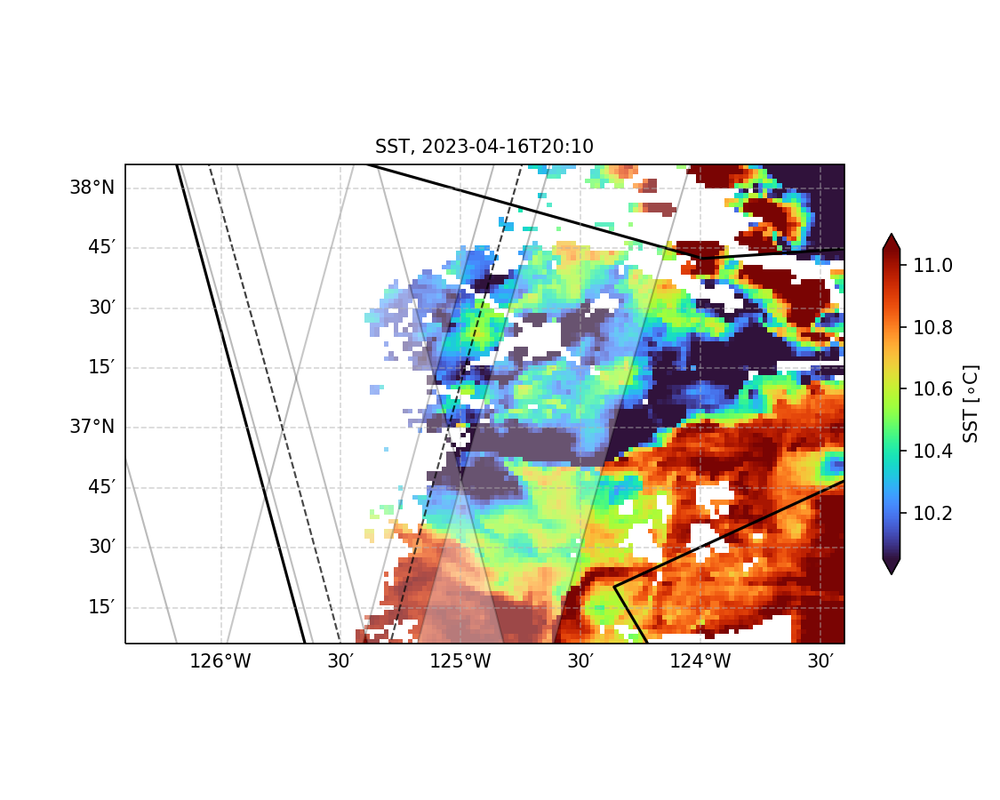

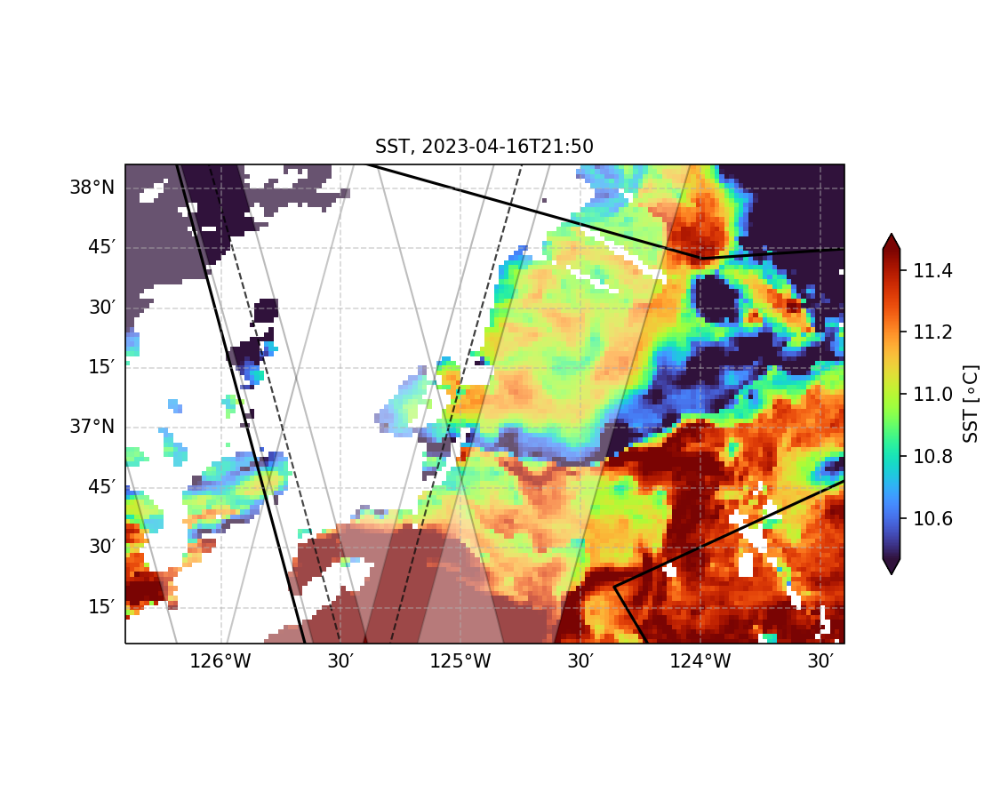

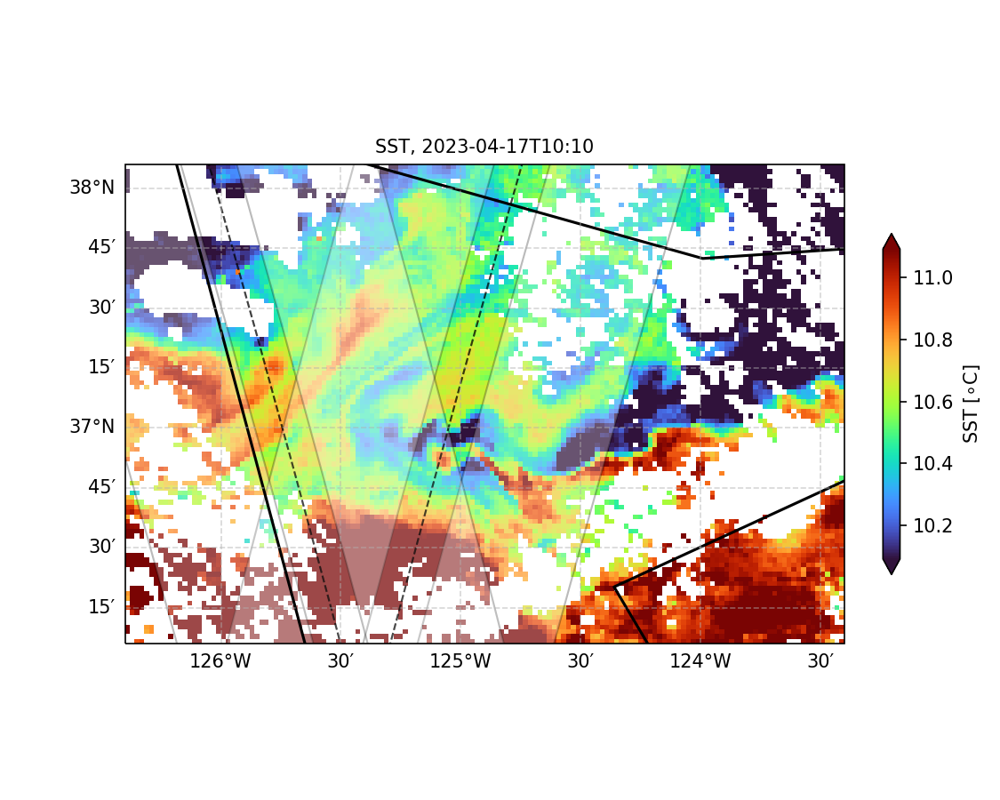

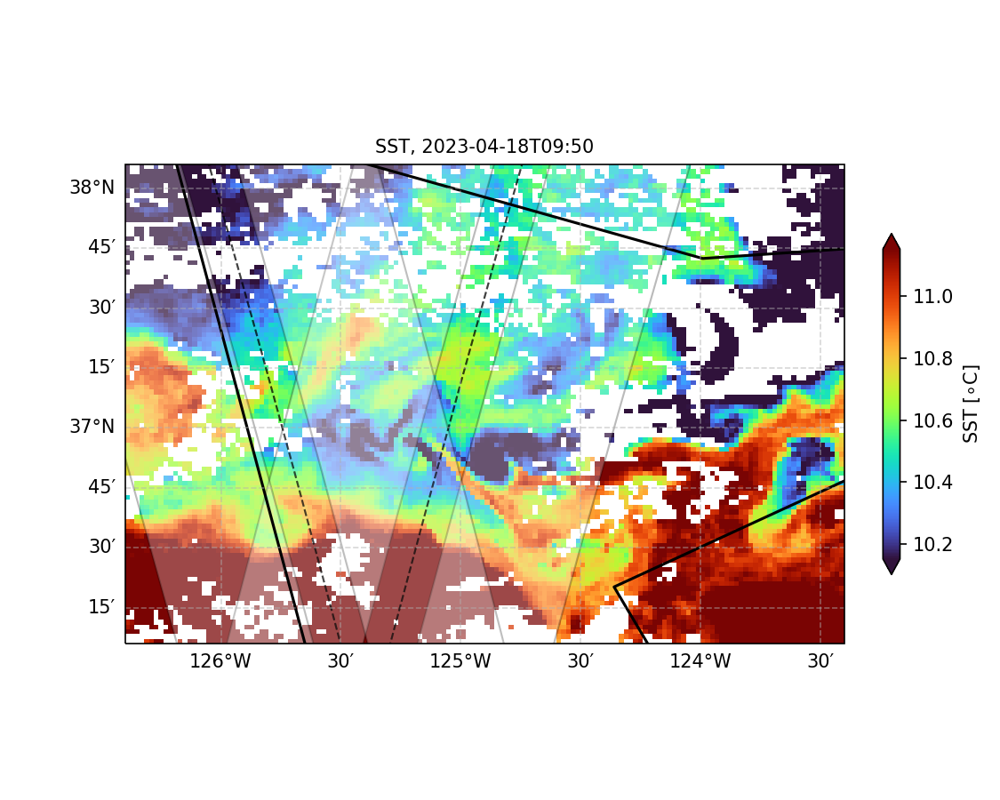

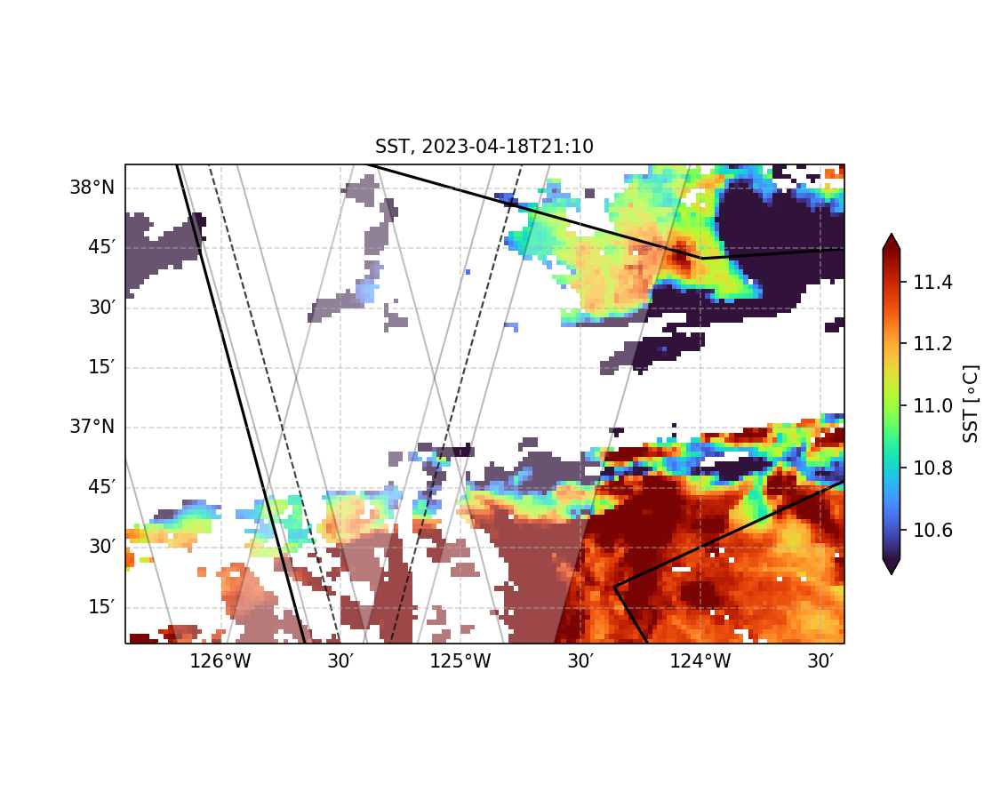

...

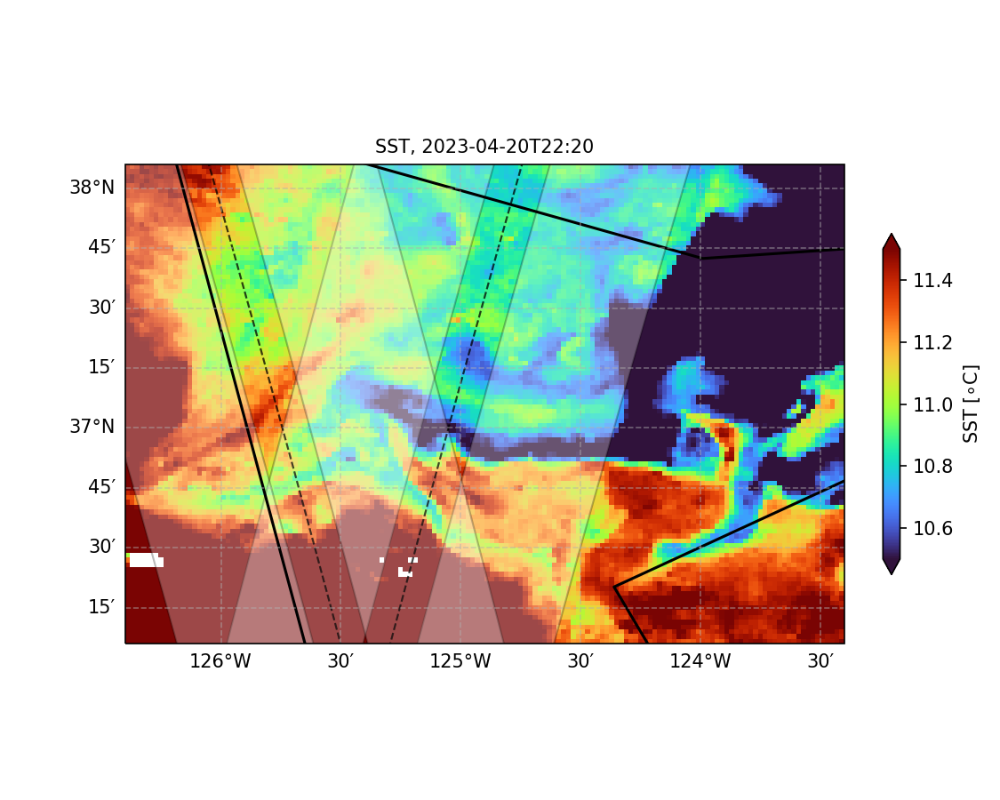

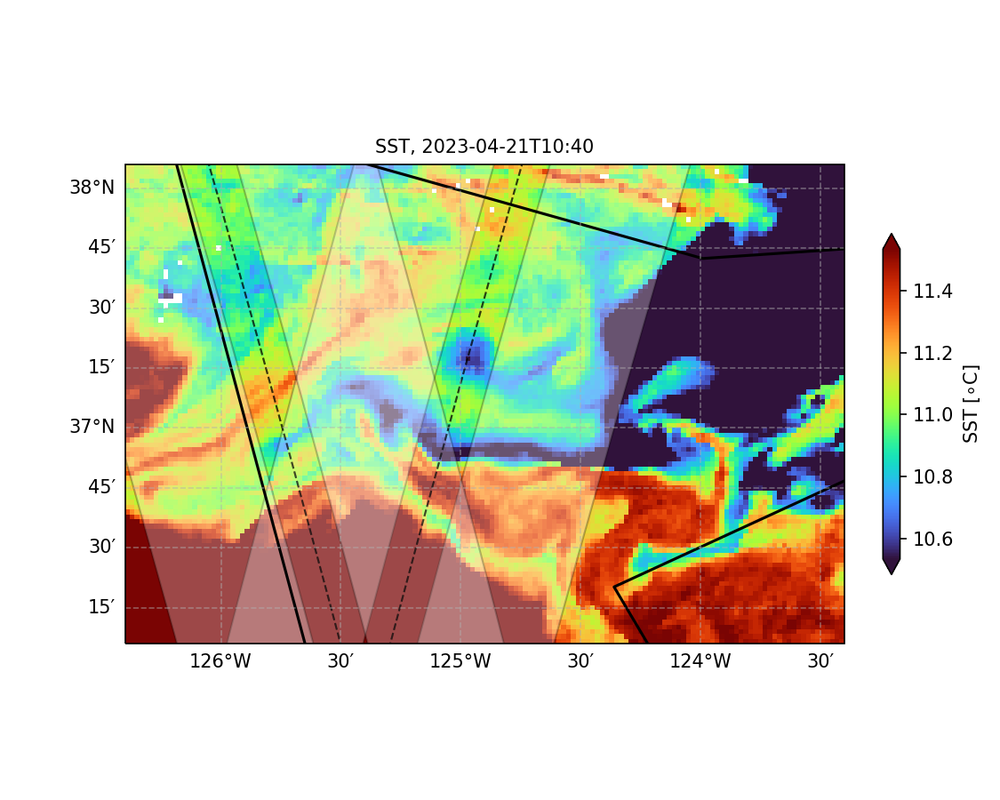

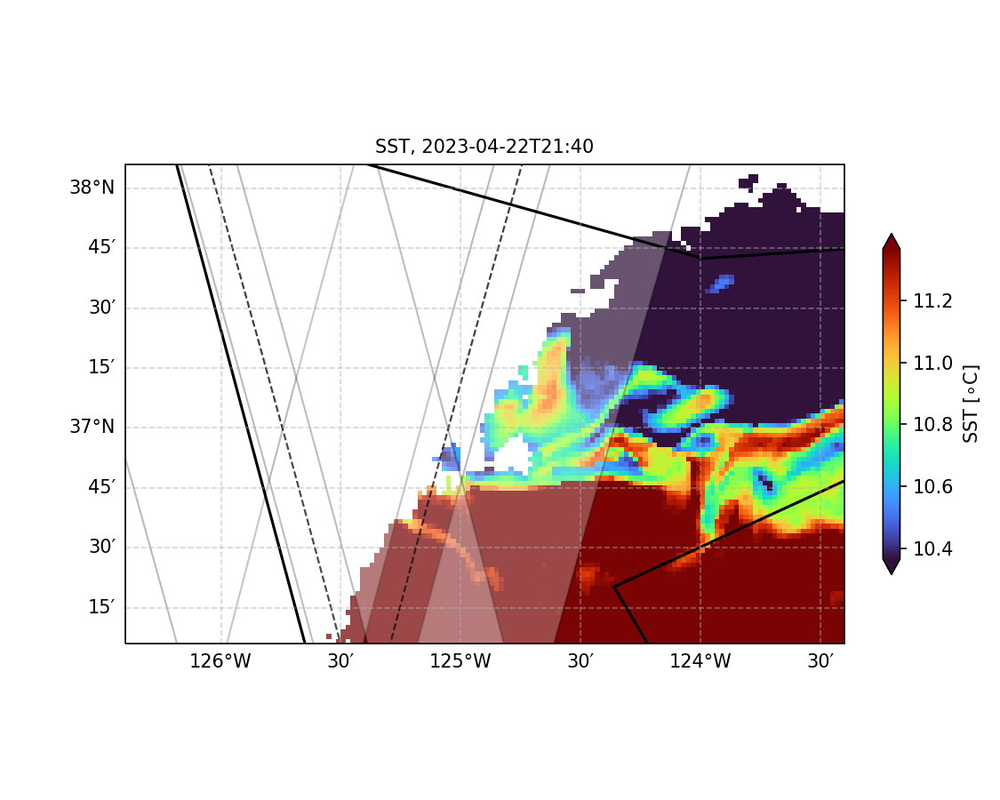

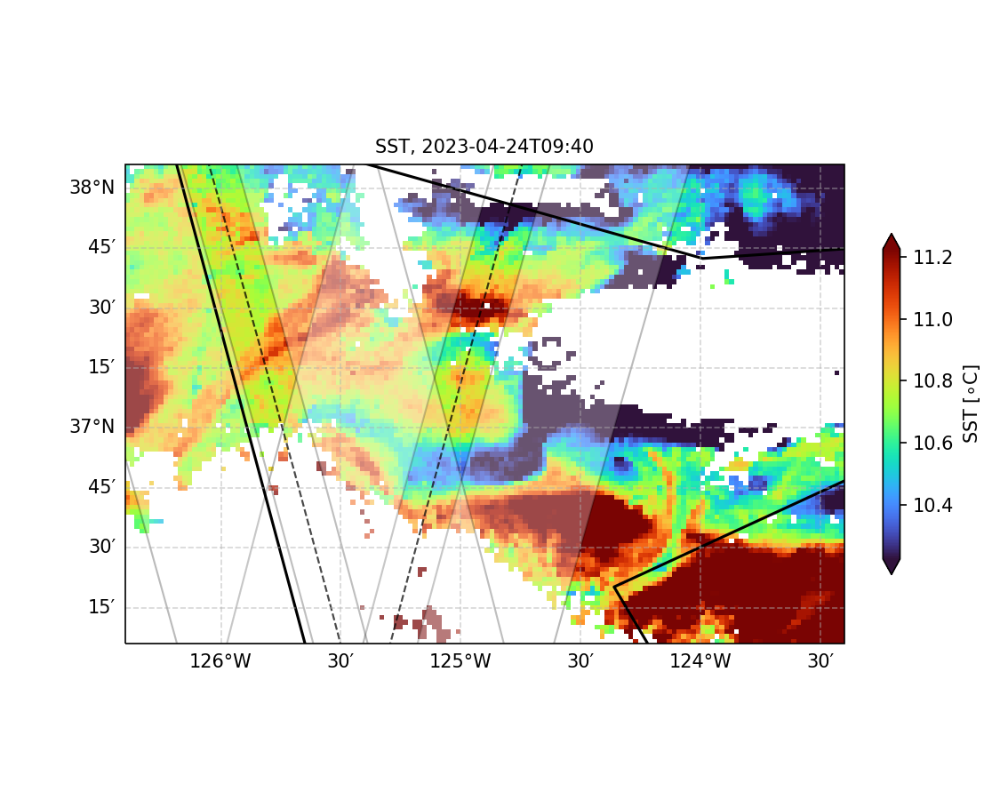

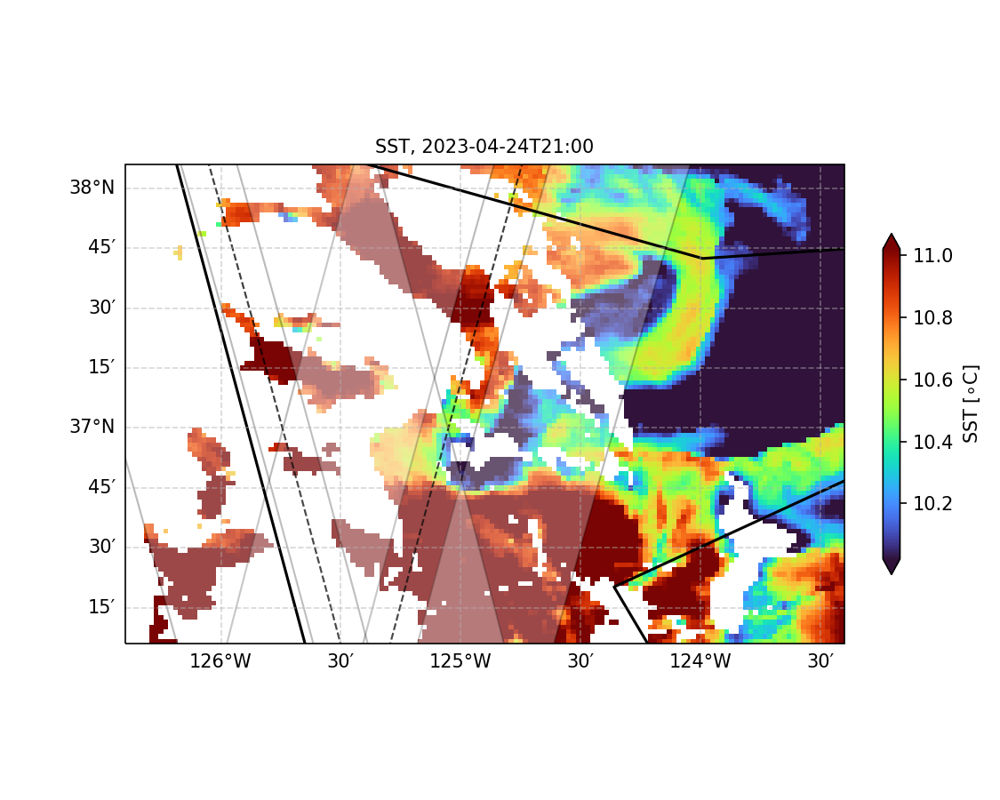

/tmp/ipykernel_428/3784413258.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


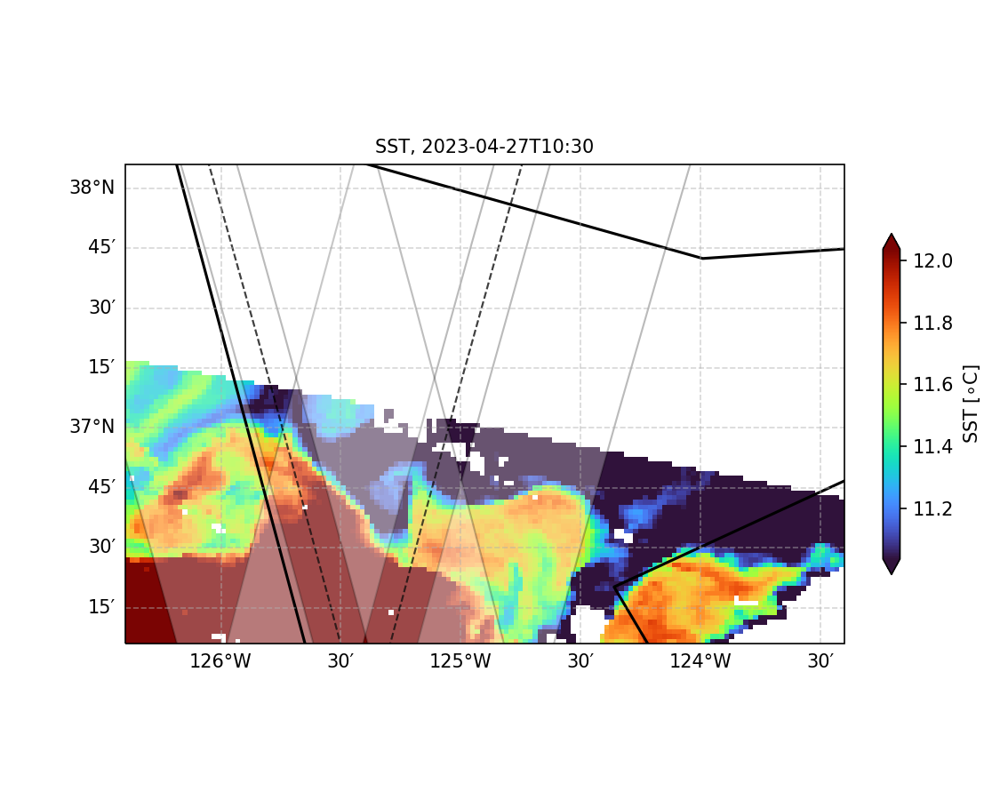

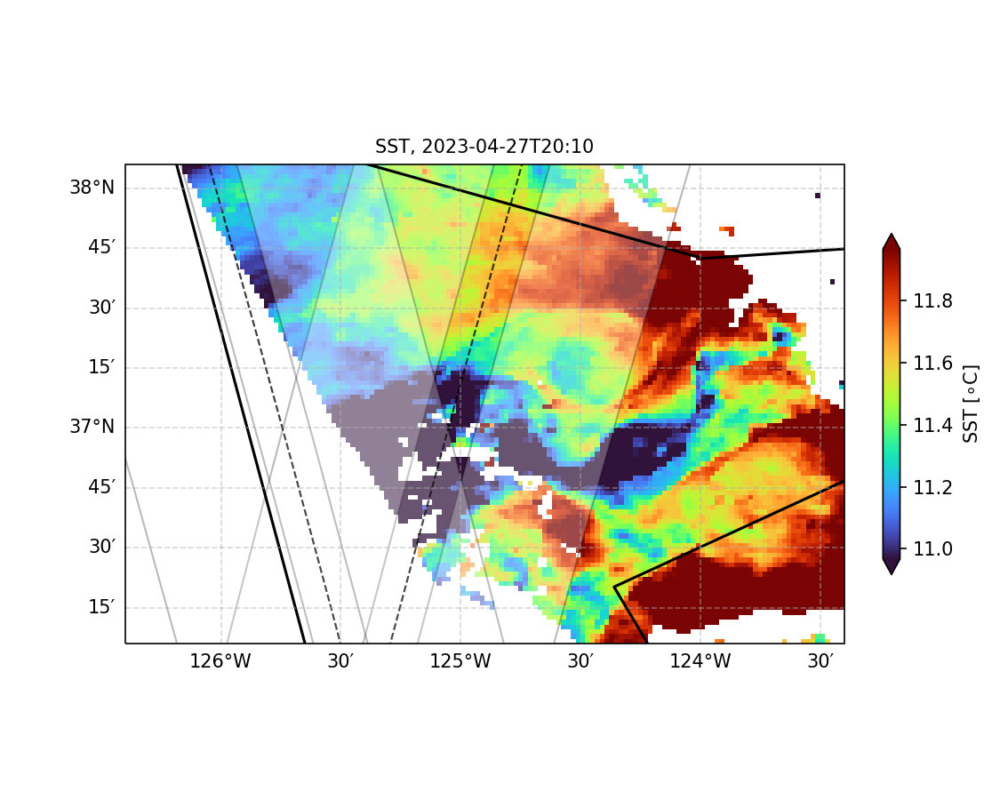

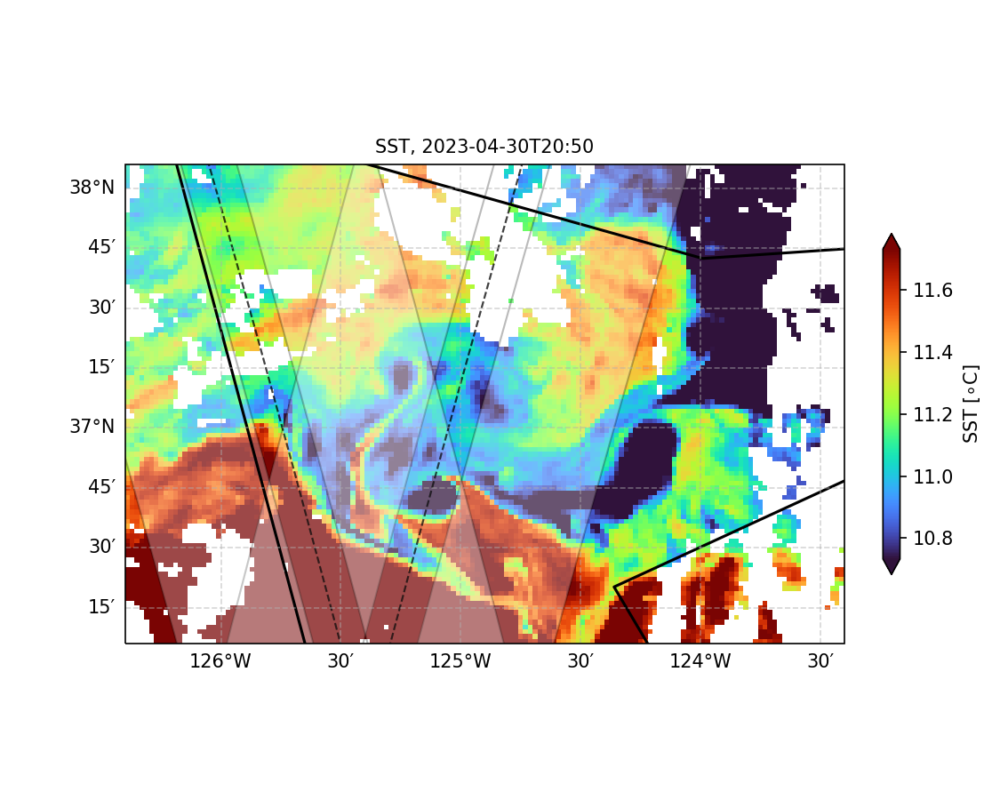

Skipping CARSON


In [16]:
filelist = []
ds_in = ds1
ds_name = ds1_name
skip = 1
for n in range(0,len(ds_in.time)):
    ## Choose a particular time
    # Find the data near this time
    ds = ds_in.isel(time=n)
    day_str = ds.time.dt.strftime("%Y-%m-%d-%H%MZ").values

    mean_SST = np.nanmean(ds.sel(lat=slice(lat_max,lat_min),lon=slice(lon_min,lon_max)).sea_surface_temperature.squeeze()-274.15)

    plot_SST_map(ds,mean_SST)
    ax = plt.gca()
    plot_SWOT(ax)
    plt.show()
    filelist.append('./data_out/'+ds_name+str(n))
    t0 = ds.time
    plot_WG_positions(ax,t0,skip)
    plot_SR_positions(ax,t0,skip)
    # Export figure
    if savefig:
        plt.savefig(__figdir__+'map_'  + day_str + ds_name + '.' +plotfiletype,**savefig_args)

In [17]:
foo = ds.time.dt.strftime("%Y-%m-%d %H:%M").values

In [18]:
foo

array('2023-04-30 20:50', dtype=object)

In [19]:
plt.close('all')

In [20]:
plot_SR_positions(ax,t0,skip)

In [21]:
np.datetime_as_string(ds.time,unit='m')

'2023-04-30T20:50'

In [22]:
ds.time.dt.strftime("%Y-%m-%d-%H%MZ").values

array('2023-04-30-2050Z', dtype=object)